In [100]:
import sys
sys.path.append('../training_performance')

import platform
from pathlib import Path
from datetime import datetime, timedelta
import datajoint as dj
dj.blob.use_32bit_dims = True # necessary for pd.blob read

from create_trials_df import create_trials_df_from_dj
from create_days_df import create_days_df_from_dj, lazy_load_days_summary_df

from multiplot_summaries import *

import plot_utils as pu
import dj_utils as dju
import dir_utils as du

from plot_trials_info import *
from plot_days_info import *

import seaborn as sns
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np 

# settingsb
%load_ext autoreload
%autoreload 2
sns.set_context("talk")

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [135]:
animals = ["R010", "R011", "R012", "R015", "R023", "R024", "R025", "R029", "C215"]
f_path = "/Users/jessbreda/Desktop/github/jbreda_animal_training/data/meetings/2024_02_26_Meeting_Plots.csv"

date_min, date_max = dju.return_date_window(latest_date=None, n_days_back=20)
df = create_trials_df_from_dj(animals, date_min, date_max)  # 2024-02-06 and 2024-02-26

df.to_csv(
    f_path,
    index=False,
)
df = pd.read_csv(f_path)

[2024-02-27 09:44:54,486][WARNING]: MySQL server has gone away. Reconnecting to the server.


fetched 19 sessions for R010 between 2024-02-07 and 2024-02-26
fetched 19 sessions for R011 between 2024-02-07 and 2024-02-26
fetched 19 sessions for R012 between 2024-02-07 and 2024-02-26
fetched 19 sessions for R015 between 2024-02-07 and 2024-02-26
fetched 18 sessions for R023 between 2024-02-07 and 2024-02-27
fetched 18 sessions for R024 between 2024-02-07 and 2024-02-26
fetched 18 sessions for R025 between 2024-02-07 and 2024-02-26
fetched 18 sessions for R029 between 2024-02-07 and 2024-02-26
fetched 18 sessions for C215 between 2024-02-07 and 2024-02-26


In [136]:
def check_adaptive(group):
    group["adaptive"] = any(group.give_delay_dur.diff() < 0)
    return group


df = df.groupby(["animal_id", "date"]).apply(check_adaptive).reset_index(drop=True)

df = df.query("adaptive == 1").copy()

## Across Sessions 

In [113]:
def plot_adaptive_threshold_summary_days(df, animal_id):
    fig, ax = plt.subplots(3, 1, figsize=(12, 4 * 3), sharex=True)

    plot_df = df.query("animal_id == @animal_id").copy()

    plot_stim_performance_by_pro_anti(
        plot_df, aesthetics=False, ax=ax[0], title="Pro & Anti Perf"
    )
    plot_give_use_rate_days(
        plot_df, ax[1], aesthetics=False, title="Give Delivered Rate"
    )
    plot_give_delay_dur_days_line(
        plot_df, aesthetics=False, ax=ax[2], title="Avg. Delay Pre-Give"
    )

    # add info for adaptive threshold
    sns.lineplot(
        data=plot_df,
        x="date",
        y="give_del_adagrow_threshold",
        marker="x",
        color="k",
        ax=ax[1],
        label="Adaptive Threshold",
    )

    _ = plt.xticks(rotation=45)
    ax[2].set(ylim=(0, None))

    plt.suptitle(f"{animal_id} Adaptive Growth Summary")

    return None

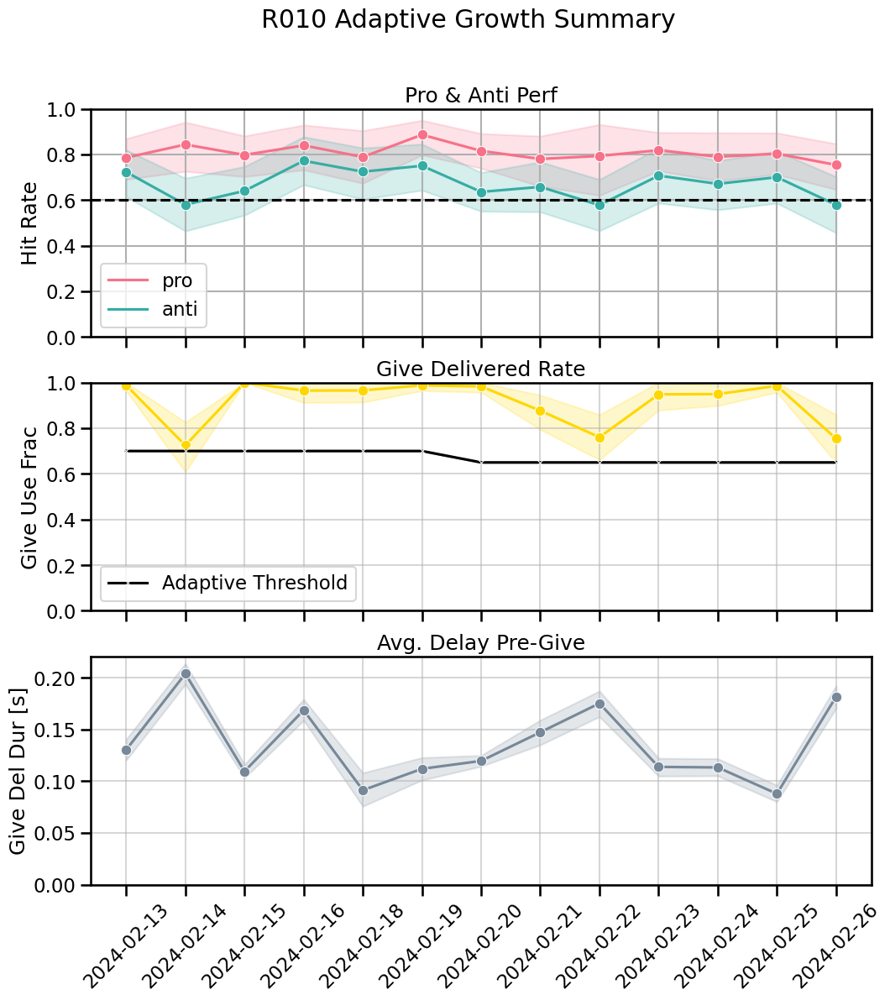

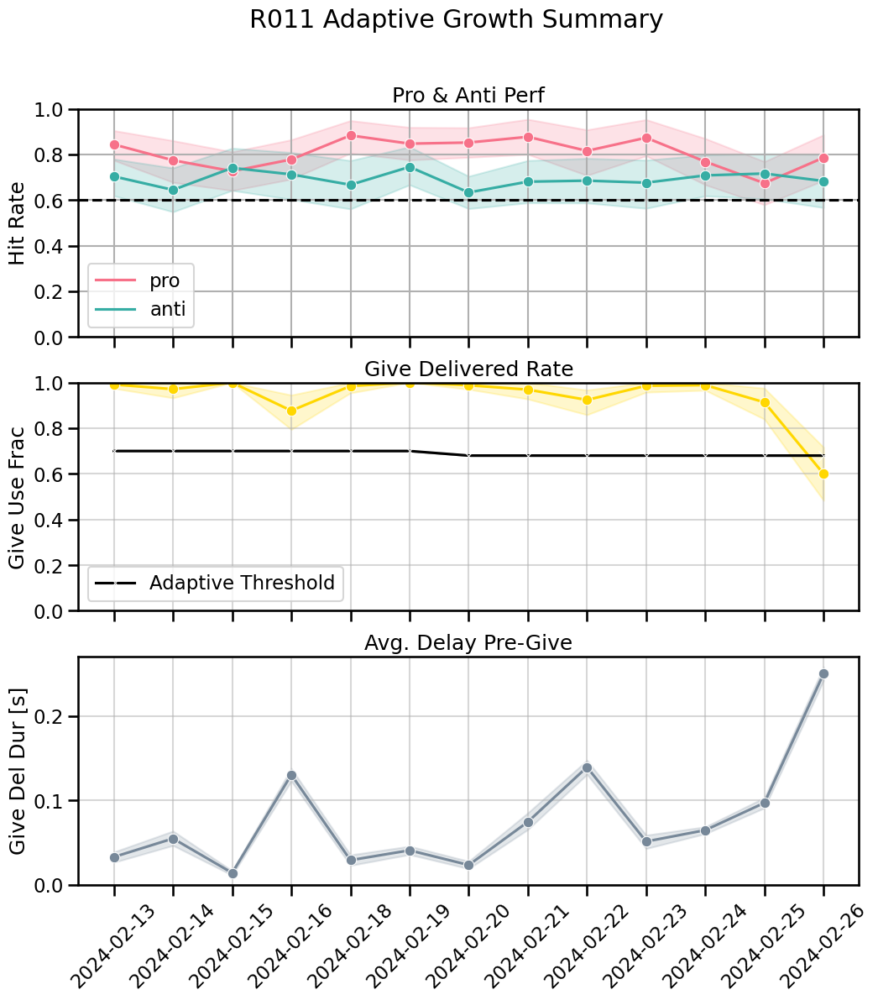

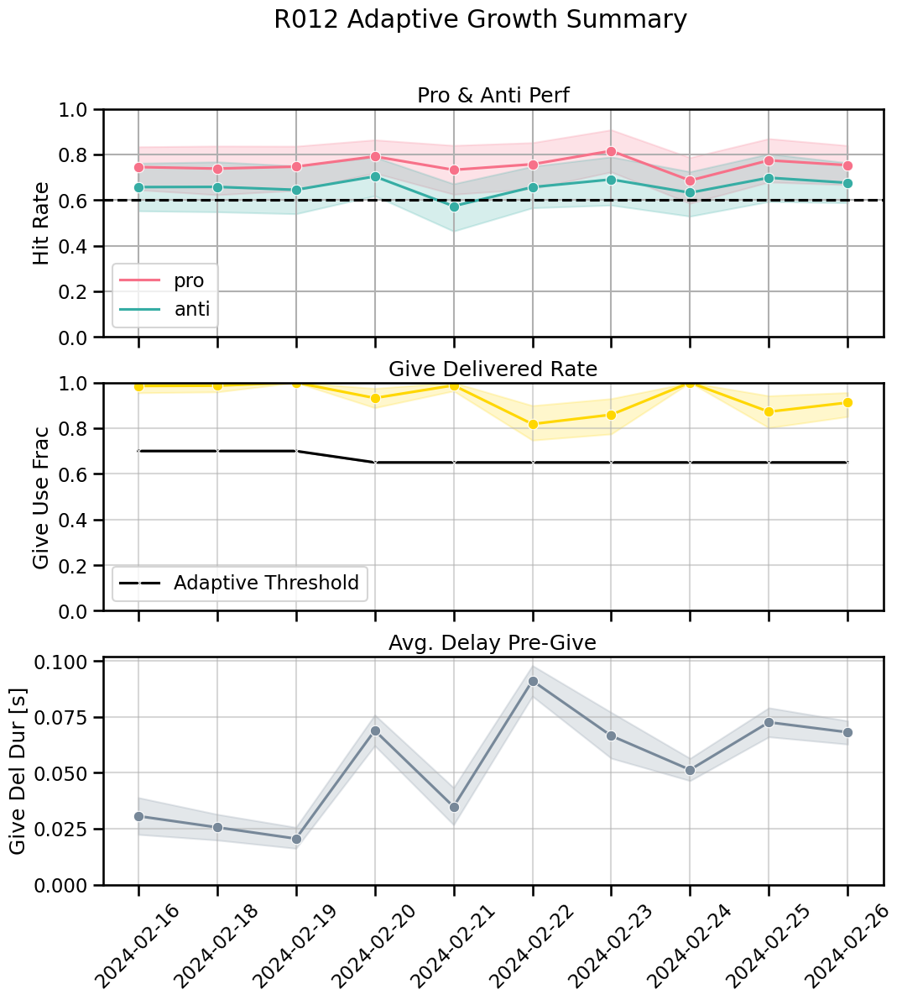

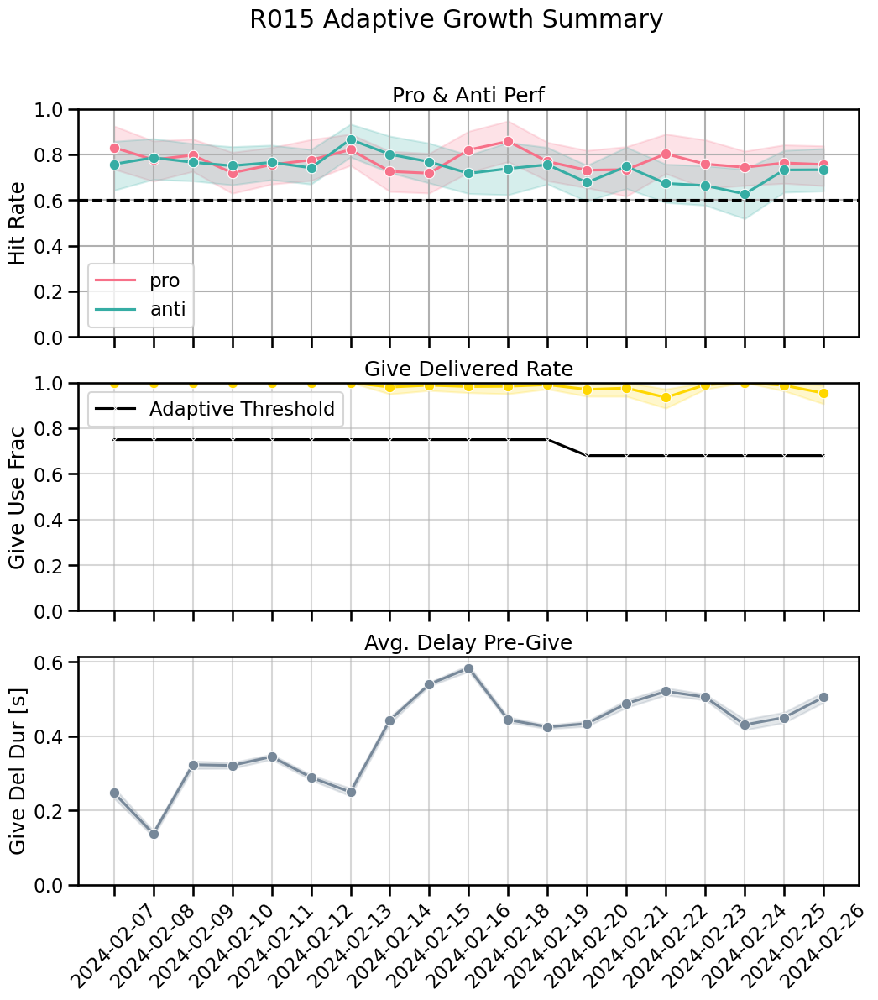

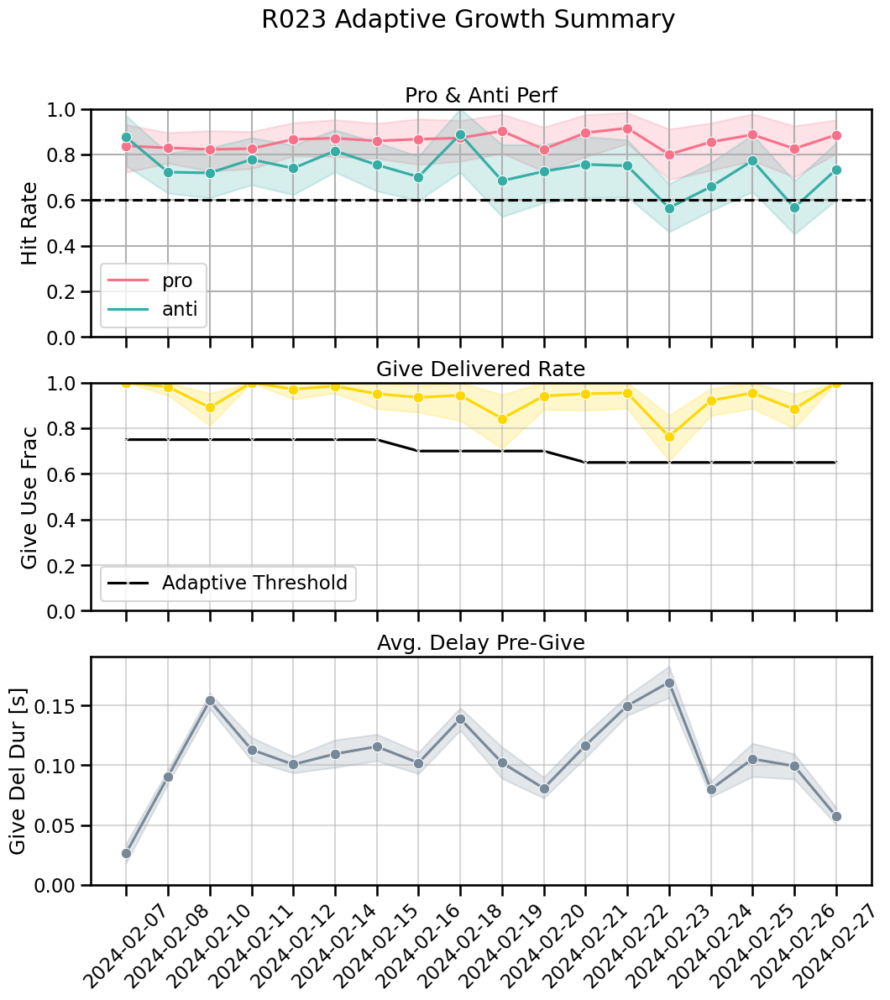

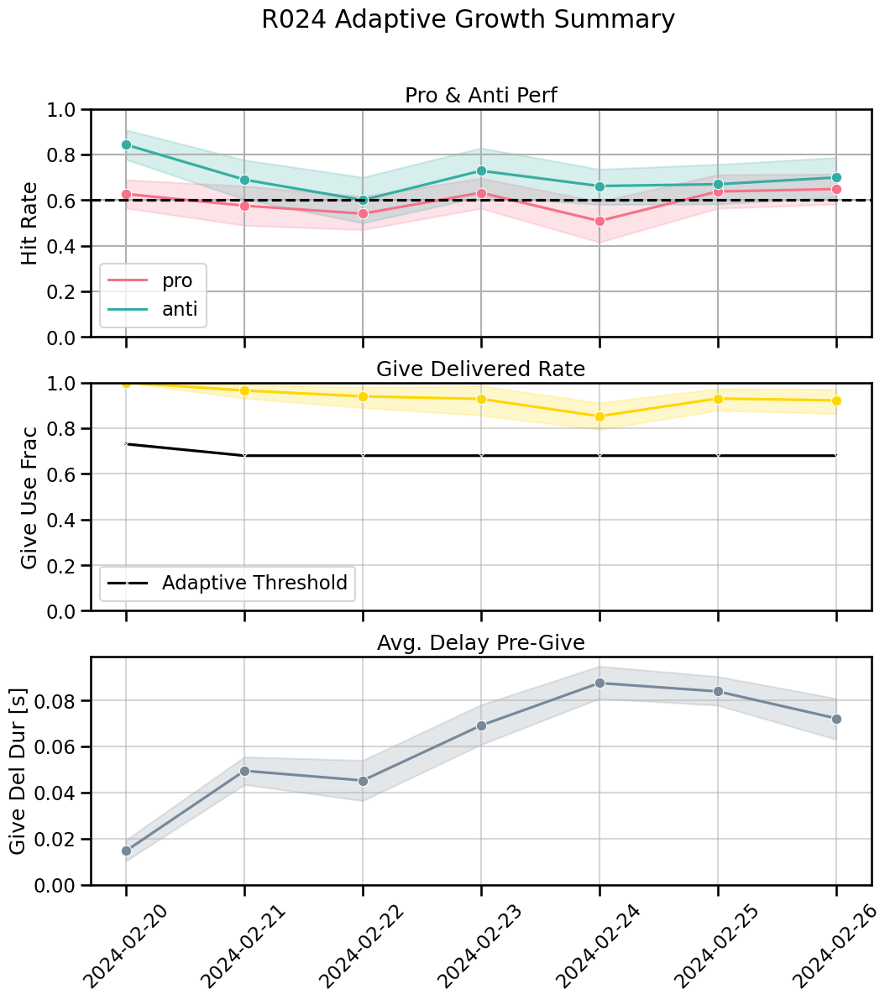

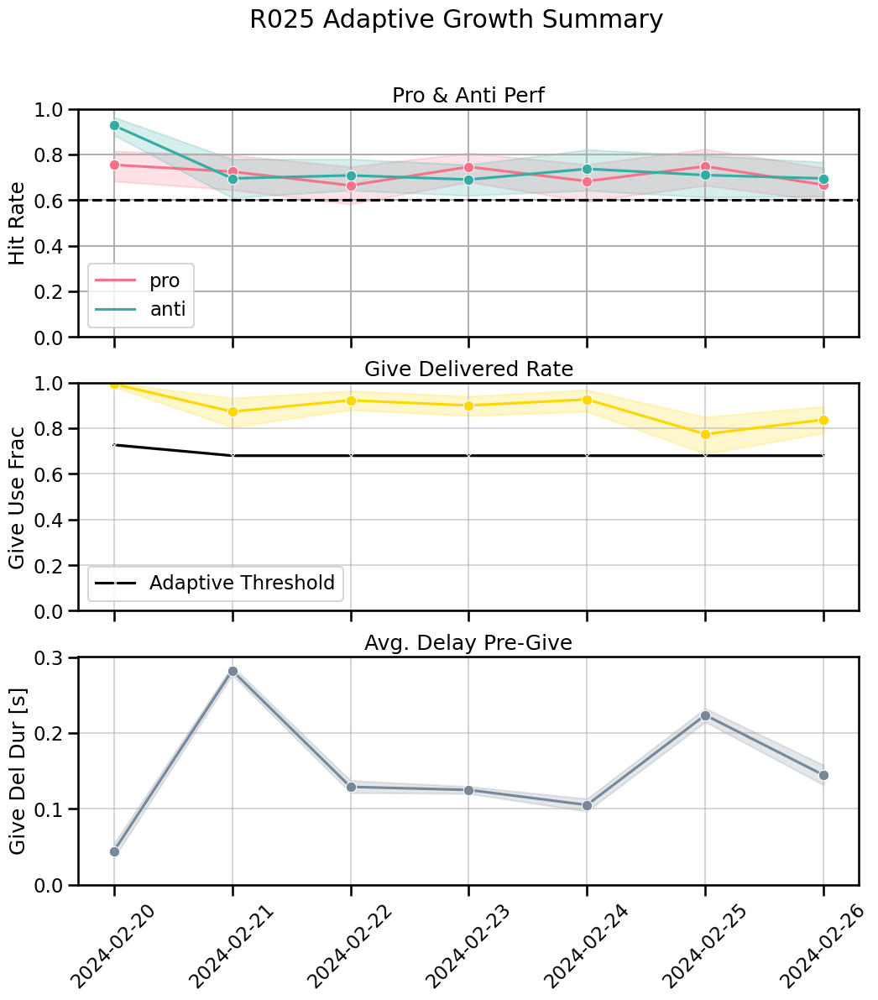

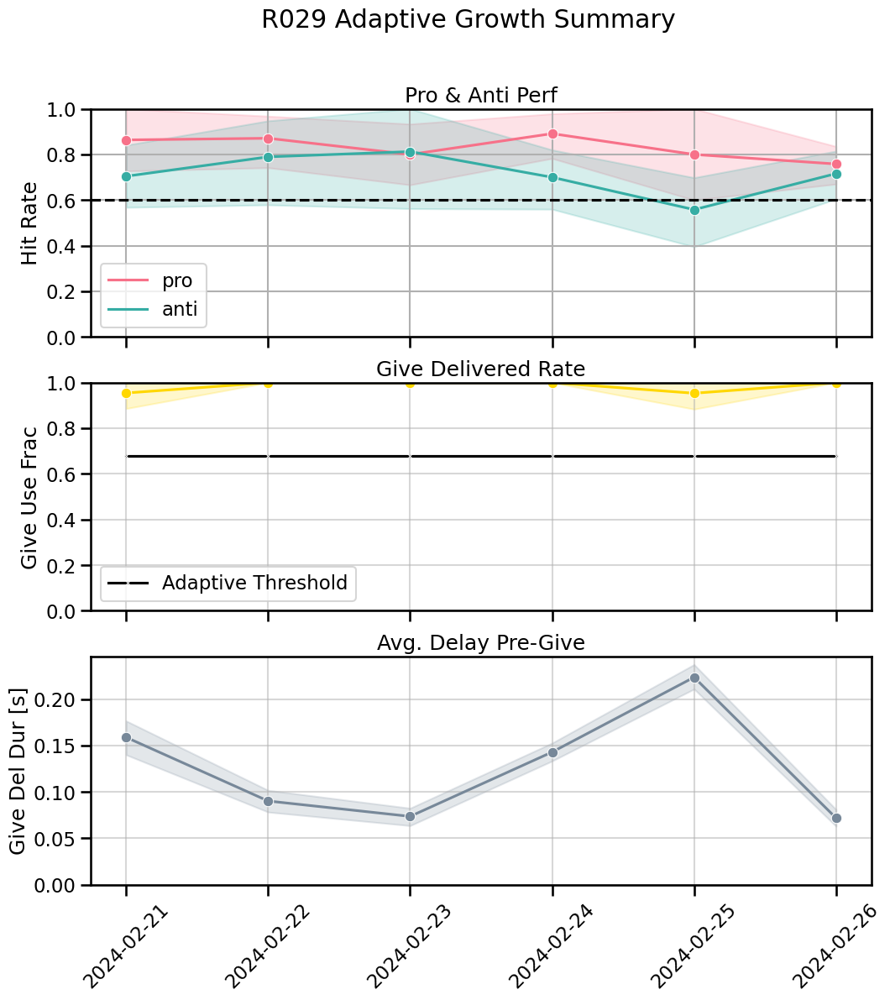

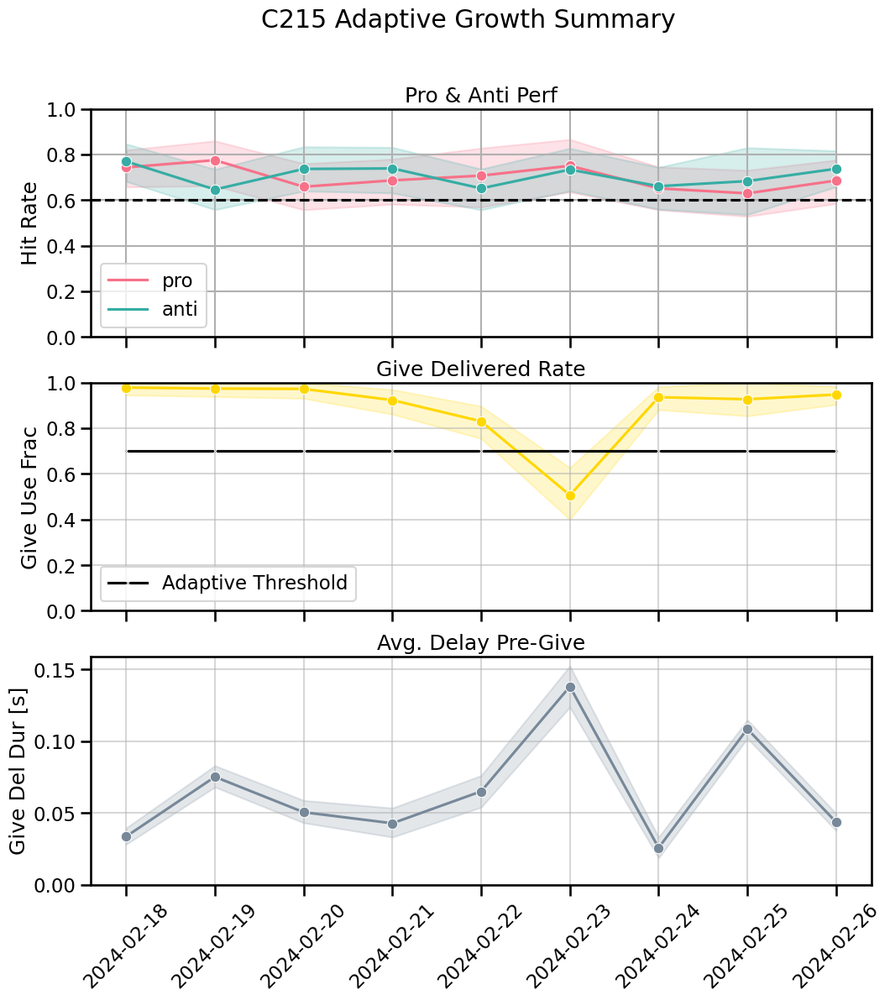

In [137]:
for animal_id in animals:
    plot_adaptive_threshold_summary_days(df, animal_id)

## Within Sessions

In [130]:
def plot_adaptive_within_session_over_days(
    df, animal_id, save_out=False, save_path=None
):

    plot_df = df.query("animal_id == @animal_id").copy()

    for idx, (date, sub_df) in enumerate(plot_df.groupby("date")):
        if len(sub_df.pro_anti_block_type.unique()) == 1:
            continue

        fig, ax = plt.subplots(2, 1, figsize=(12, 8), sharex=True)
        plot_rolling_hit_rate_by_pro_anti(sub_df, ax[0])
        plot_anti_give_del_metrics(
            sub_df,
            ax[1],
            title=f"threshold = {sub_df.give_del_adagrow_threshold.min()}, ",
        )

        fig.suptitle(f"{animal_id} on {date}")

        if save_out:
            plt.savefig(save_path + f"{animal_id}_{date}_adaptive_threshold_plots.png")

/var/folders/__/8jn6qz211155h1xb451s5zcr0000gn/T/ipykernel_46143/3678576853.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(2, 1, figsize=(12, 8), sharex=True)


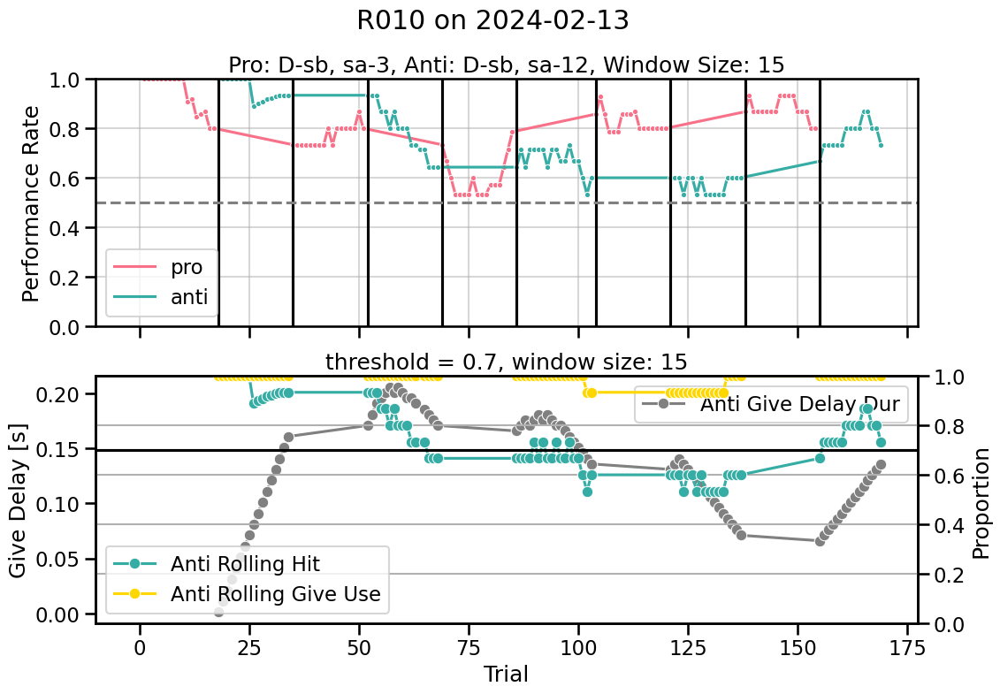

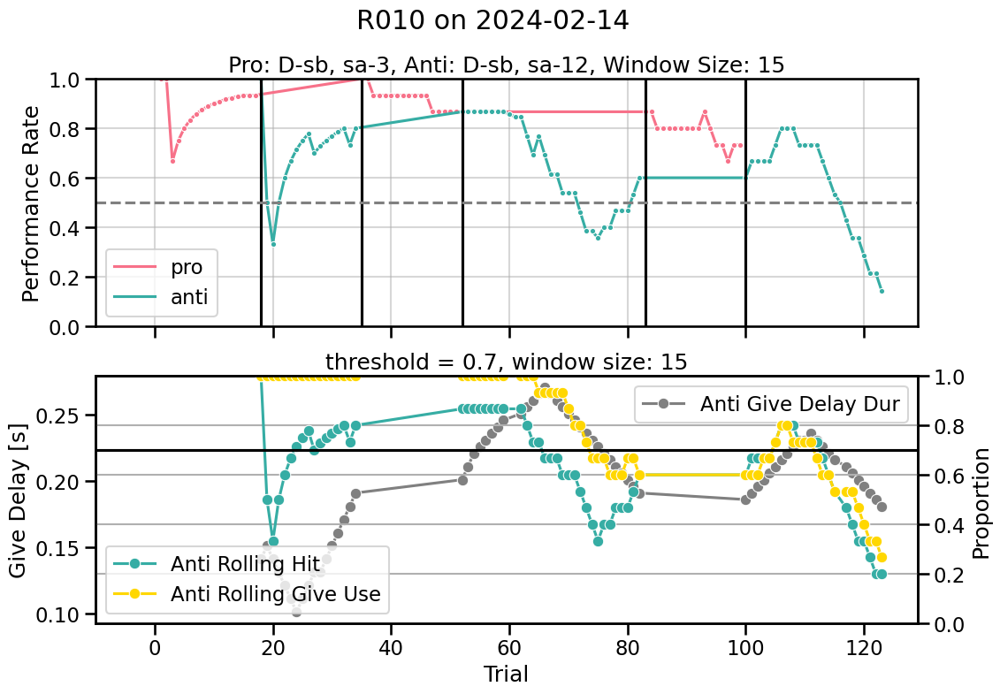

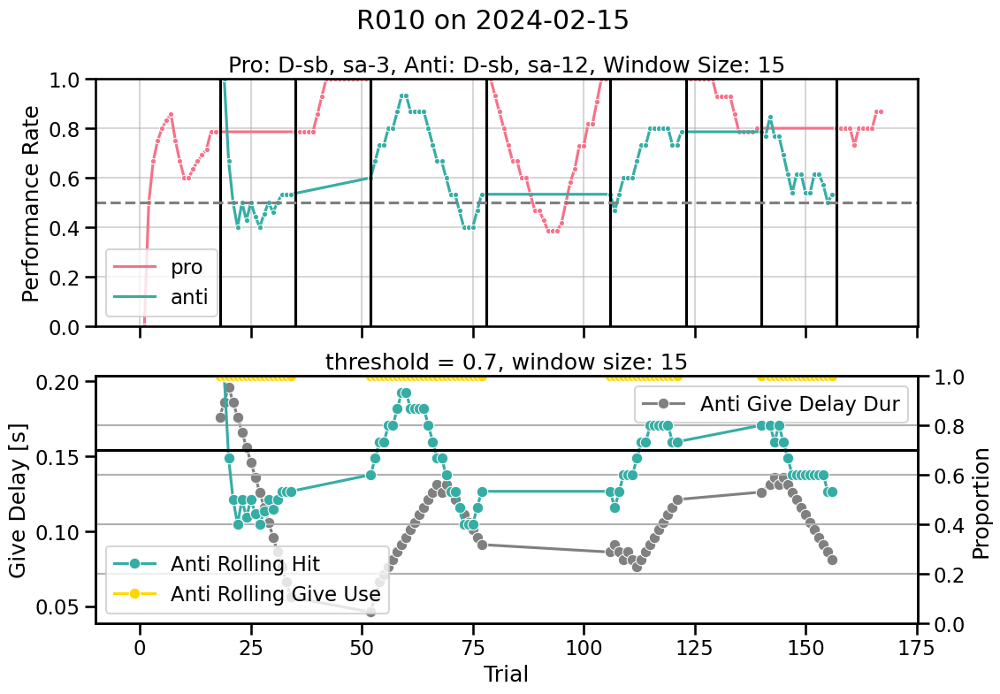

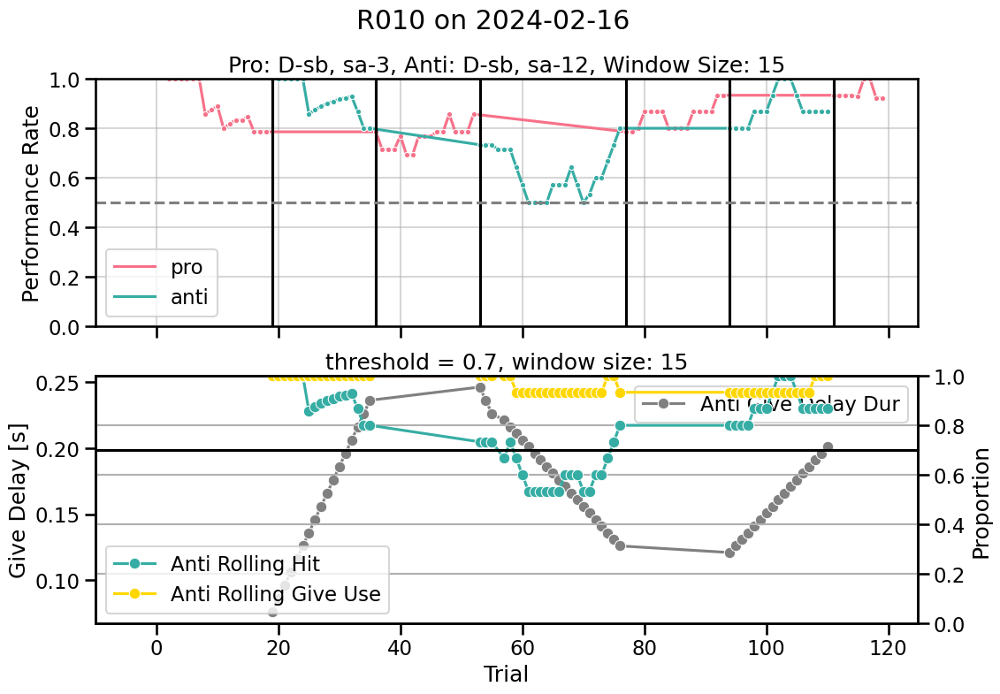

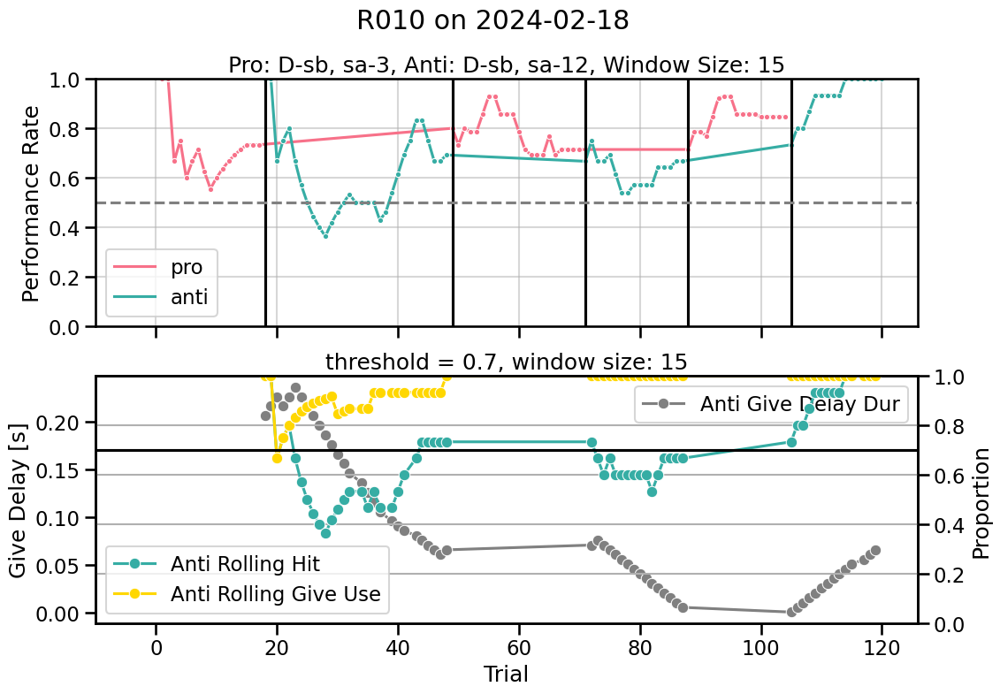

...

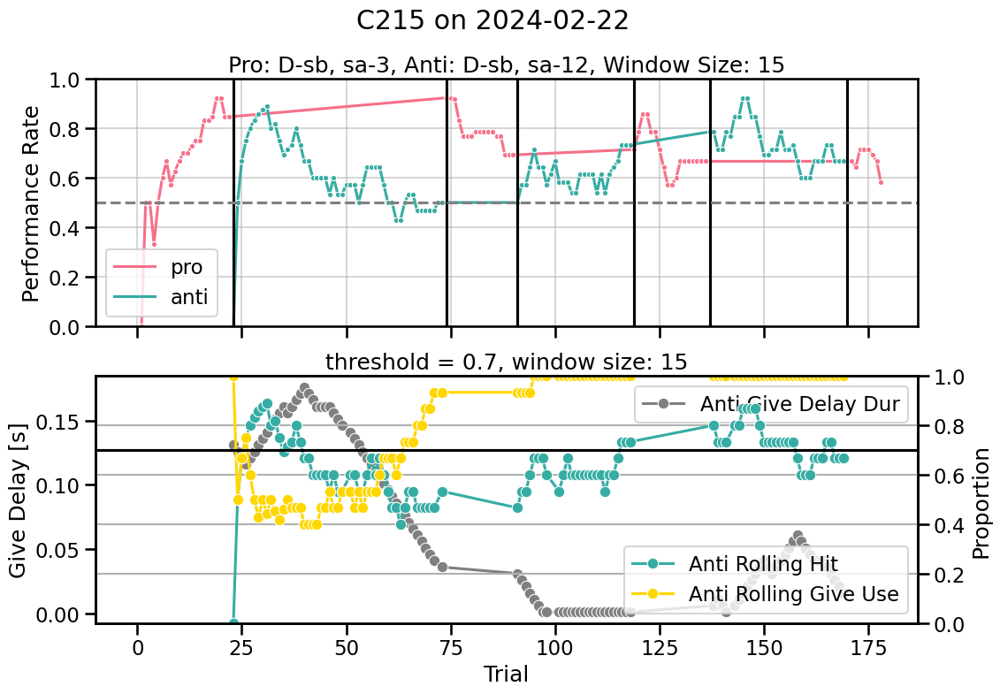

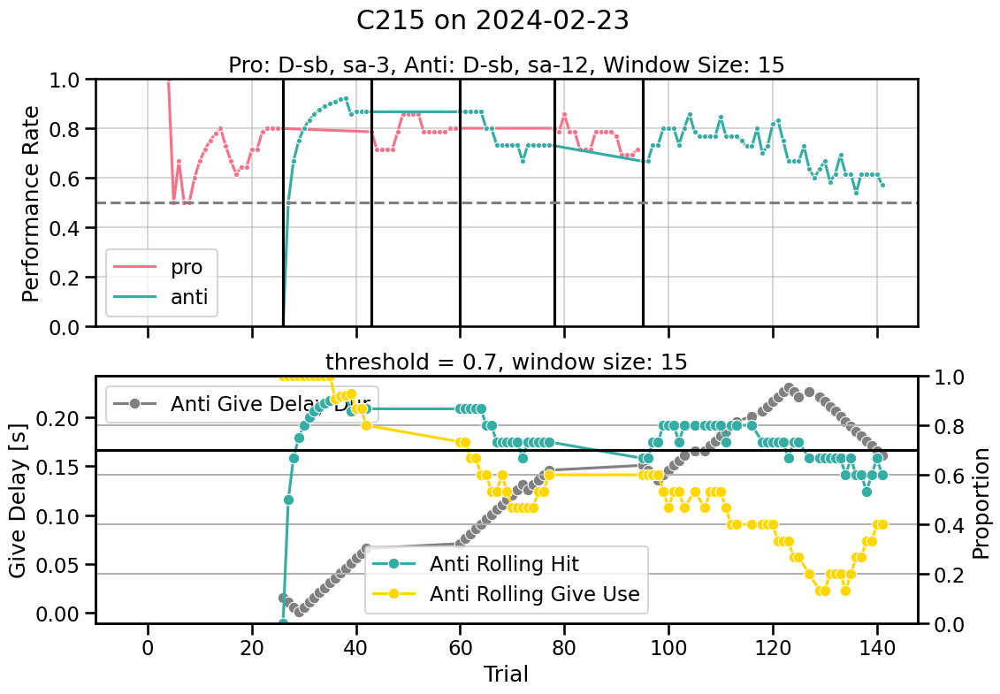

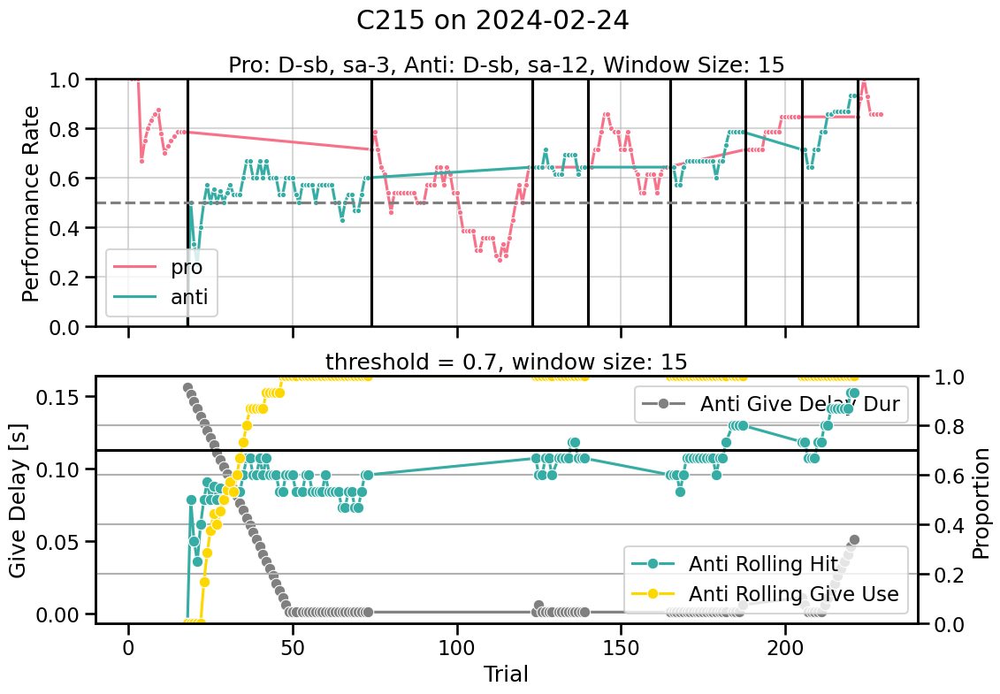

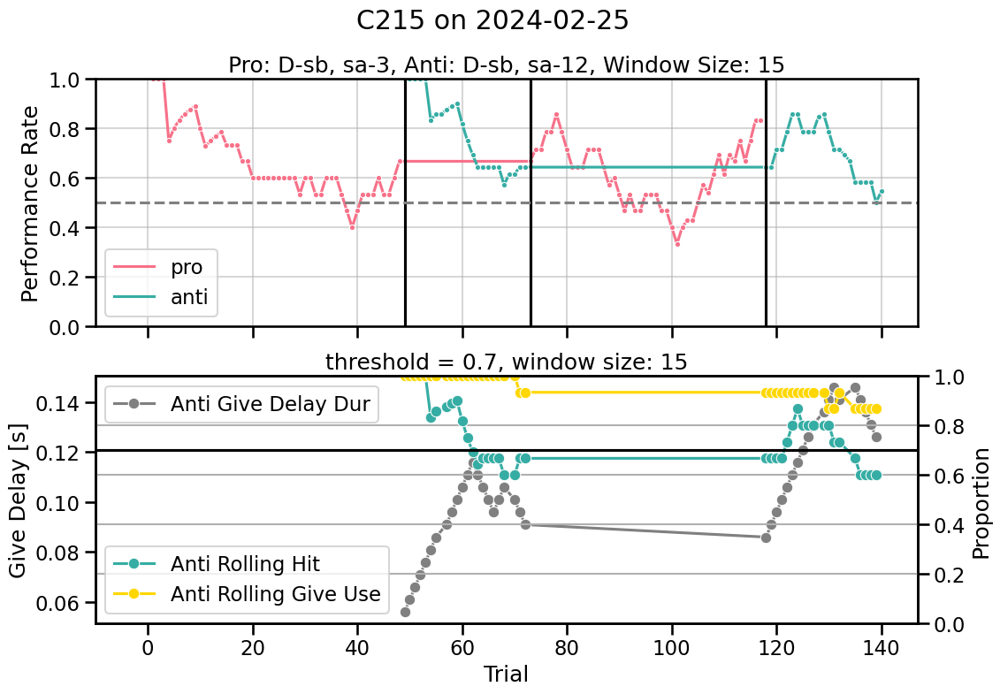

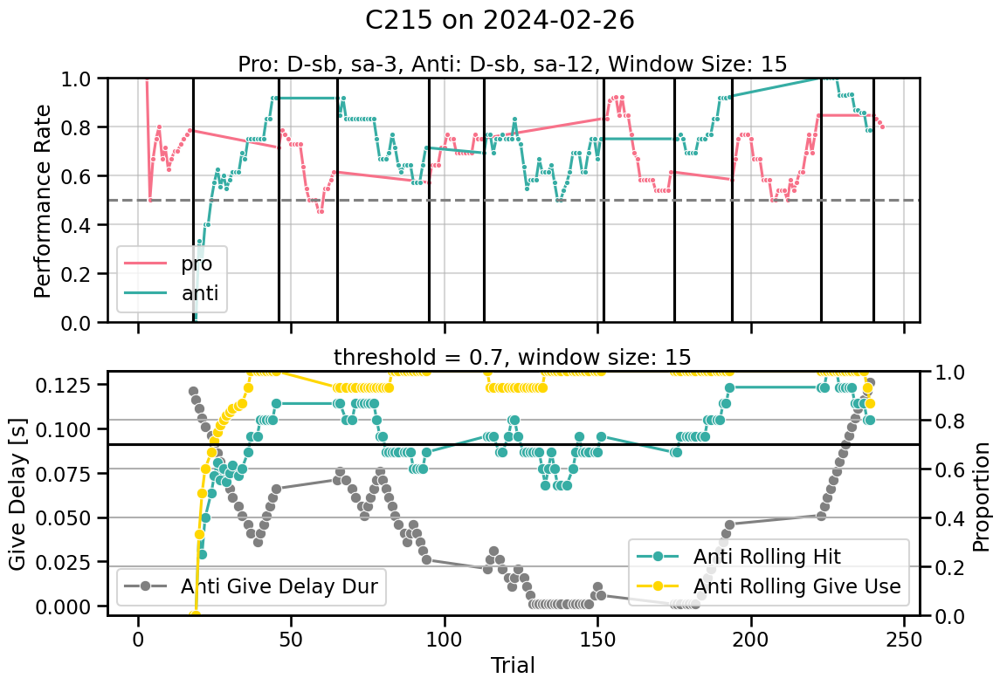

In [138]:
for animal_id in animals:
    plot_adaptive_within_session_over_days(
        df,
        animal_id,
        save_out=True,
        save_path="/Users/jessbreda/Desktop/github/jbreda_animal_training/figures/meetings/2024_02_27/",
    )